## November 14th 2017

Going to try and repeat the codelab exercise from here in a python notebook

##need to pass these shell variables 

```
IMAGE_SIZE=224
ARCHITECTURE="mobilenet_0.50_${IMAGE_SIZE}"
```

In [1]:
!IMAGE_SIZE=224
!ARCHITECTURE="mobilenet_0.50_${IMAGE_SIZE}"


## November 15th 2017

Working through getting started guide at 

```
https://www.tensorflow.org/get_started/get_started
```

In [3]:
import tensorflow as tf

node1 = tf.constant(3.0, dtype=tf.float32)

#building a simple computational graph
node2 = tf.constant(4.0) # also tf.float32 implicitly
print(node1, node2)

ImportError: No module named tensorflow

In [7]:
# create a session to evaluate the nodes
sess = tf.Session()
print(sess.run([node1, node2]))

# perform operations on nodes (operations are also nodes)
from __future__ import print_function
node3 = tf.add(node1, node2)
print("node3:", node3)
print("sess.run(node3):", sess.run(node3))

[3.0, 4.0]
node3: Tensor("Add:0", shape=(), dtype=float32)
sess.run(node3): 7.0


In [8]:
# we can visualize graphs we are creating in tensorflow. This code sets up placeholders (external inputs to graph)

a = tf.placeholder(tf.float32)
b = tf.placeholder(tf.float32)
adder_node = a + b  # + provides a shortcut for tf.add(a, b)

In [13]:
print(sess.run(adder_node, {a: 3, b: 4.5}))
print(sess.run(adder_node, {a: [1, 3], b: [2, 4]}))

add_and_triple = adder_node * 3.
print(sess.run(add_and_triple, {a: 3, b: 4.5}))

#print(sess.run(adder_node, {a:node1.value_index, b:node2.value_index}))

7.5
[ 3.  7.]
22.5


In [15]:
# Variables can add trainable parameters to a graph
W = tf.Variable([.3], dtype=tf.float32)
b = tf.Variable([-.3], dtype=tf.float32)
x = tf.placeholder(tf.float32)
linear_model = W*x + b

In [16]:
# to initialize all variables in a session we need to do this

init = tf.global_variables_initializer()
sess.run(init)

In [17]:
# since x is a placeholder we can evaluate linear_model for several values of x at once
print(sess.run(linear_model, {x: [1, 2, 3, 4]}))

[ 0.          0.30000001  0.60000002  0.90000004]


In [18]:
#We've created a model, but we don't know how good it is yet. To evaluate the model on training data, we need a y placeholder to provide the desired values, and we need to write a loss function.

y = tf.placeholder(tf.float32)
squared_deltas = tf.square(linear_model - y)
loss = tf.reduce_sum(squared_deltas)
print(sess.run(loss, {x: [1, 2, 3, 4], y: [0, -1, -2, -3]}))

23.66


In [19]:
# if we knew the perfect values for W and b the loss function would be 0

fixW = tf.assign(W, [-1.])
fixb = tf.assign(b, [1.])
sess.run([fixW, fixb])
print(sess.run(loss, {x: [1, 2, 3, 4], y: [0, -1, -2, -3]}))

0.0


In [20]:
# lets use machine learning to discover the optimal values

#using a gradient descent optimizer
optimizer = tf.train.GradientDescentOptimizer(0.01)
train = optimizer.minimize(loss)

    
    


In [21]:
sess.run(init) # reset values to incorrect defaults.
for i in range(1000):
  sess.run(train, {x: [1, 2, 3, 4], y: [0, -1, -2, -3]})

print(sess.run([W, b]))

[array([-0.9999969], dtype=float32), array([ 0.99999082], dtype=float32)]


In [22]:
# the complete trainable linear model program
import tensorflow as tf

# Model parameters
W = tf.Variable([.3], dtype=tf.float32)
b = tf.Variable([-.3], dtype=tf.float32)
# Model input and output
x = tf.placeholder(tf.float32)
linear_model = W*x + b
y = tf.placeholder(tf.float32)

# loss
loss = tf.reduce_sum(tf.square(linear_model - y)) # sum of the squares
# optimizer
optimizer = tf.train.GradientDescentOptimizer(0.01)
train = optimizer.minimize(loss)

# training data
x_train = [1, 2, 3, 4]
y_train = [0, -1, -2, -3]
# training loop
init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init) # reset values to wrong
for i in range(1000):
  sess.run(train, {x: x_train, y: y_train})

# evaluate training accuracy
curr_W, curr_b, curr_loss = sess.run([W, b, loss], {x: x_train, y: y_train})
print("W: %s b: %s loss: %s"%(curr_W, curr_b, curr_loss))

W: [-0.9999969] b: [ 0.99999082] loss: 5.69997e-11


In [23]:
## tf.estimator library simplifies running training loops, running evaluation loops, managing data sets


# NumPy is often used to load, manipulate and preprocess data.
import numpy as np
import tensorflow as tf

# Declare list of features. We only have one numeric feature. There are many
# other types of columns that are more complicated and useful.
feature_columns = [tf.feature_column.numeric_column("x", shape=[1])]

# An estimator is the front end to invoke training (fitting) and evaluation
# (inference). There are many predefined types like linear regression,
# linear classification, and many neural network classifiers and regressors.
# The following code provides an estimator that does linear regression.
estimator = tf.estimator.LinearRegressor(feature_columns=feature_columns)

# TensorFlow provides many helper methods to read and set up data sets.
# Here we use two data sets: one for training and one for evaluation
# We have to tell the function how many batches
# of data (num_epochs) we want and how big each batch should be.
x_train = np.array([1., 2., 3., 4.])
y_train = np.array([0., -1., -2., -3.])
x_eval = np.array([2., 5., 8., 1.])
y_eval = np.array([-1.01, -4.1, -7, 0.])
input_fn = tf.estimator.inputs.numpy_input_fn(
    {"x": x_train}, y_train, batch_size=4, num_epochs=None, shuffle=True)
train_input_fn = tf.estimator.inputs.numpy_input_fn(
    {"x": x_train}, y_train, batch_size=4, num_epochs=1000, shuffle=False)
eval_input_fn = tf.estimator.inputs.numpy_input_fn(
    {"x": x_eval}, y_eval, batch_size=4, num_epochs=1000, shuffle=False)

# We can invoke 1000 training steps by invoking the  method and passing the
# training data set.
estimator.train(input_fn=input_fn, steps=1000)

# Here we evaluate how well our model did.
train_metrics = estimator.evaluate(input_fn=train_input_fn)
eval_metrics = estimator.evaluate(input_fn=eval_input_fn)
print("train metrics: %r"% train_metrics)
print("eval metrics: %r"% eval_metrics)

AttributeError: 'module' object has no attribute 'feature_column'

In [26]:
## example from https://towardsdatascience.com/tensorflow-for-absolute-beginners-28c1544fb0d6


import tensorflow as tf #importing the tensorflow library
T, F = 1.0, -1.0   #True has the +1.0 value and False has -1.0, it's important to note that
# you can assign any value to them
bias = 1.0
training_input = [
    [T, T, bias],
    [T, F, bias],
    [F, T, bias],
    [F, F, bias],
]
training_output = [
    [T],
    [F],
    [F],
    [F],
]
w = tf.Variable(tf.random_normal([3, 1]), dtype=tf.float32)
# step(x) = { 1 if x > 0; -1 otherwise }
def step(x):
    is_greater = tf.greater(x, 0)
    as_float = tf.to_float(is_greater)
    doubled = tf.multiply(as_float, 2)
    return tf.subtract(doubled, 1)

output = step(tf.matmul(training_input, w))
error = tf.subtract(training_output, output)
mse = tf.reduce_mean(tf.square(error))

delta = tf.matmul(training_input, error, transpose_a=True)
train = tf.assign(w, tf.add(w, delta))

sess = tf.Session()
sess.run(tf.global_variables_initializer())

err, target = 1, 0
epoch, max_epochs = 0, 10

while err > target and epoch < max_epochs:
    epoch += 1
    err, _ = sess.run([mse, train])
print('epoch:', epoch, 'mse:', err)

print(sess.run(w))


epoch: 1 mse: 0.0
[[ 0.2634618 ]
 [ 1.14840066]
 [-1.13413489]]


### November 16th

Bird classifier from 

```
https://medium.com/@ageitgey/machine-learning-is-fun-part-3-deep-learning-and-convolutional-neural-networks-f40359318721
```

using pics from here 

```
https://www.cs.toronto.edu/~kriz/cifar.html
```

and here

```
http://www.vision.caltech.edu/visipedia/CUB-200-2011.html
```

full data set is available here

```

https://s3-us-west-2.amazonaws.com/ml-is-fun/data.zip
```

In [29]:
# -*- coding: utf-8 -*-

"""
Based on the tflearn example located here:
https://github.com/tflearn/tflearn/blob/master/examples/images/convnet_cifar10.py
"""
from __future__ import division, print_function, absolute_import

# Import tflearn and some helpers
import tflearn
from tflearn.data_utils import shuffle
from tflearn.layers.core import input_data, dropout, fully_connected
from tflearn.layers.conv import conv_2d, max_pool_2d
from tflearn.layers.estimator import regression
from tflearn.data_preprocessing import ImagePreprocessing
from tflearn.data_augmentation import ImageAugmentation
import pickle

from tflearn.datasets import cifar10

u'/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/test-images'

In [47]:


cifar10.load_data()


 99.9% 170311680 / 170498071

('Succesfully downloaded', 'cifar-10-python.tar.gz', 170498071, 'bytes.')
File Extracted in Current Directory


100.0% 170500096 / 170498071


((array([[[[ 0.23137255,  0.24313725,  0.24705882],
           [ 0.16862745,  0.18039216,  0.17647059],
           [ 0.19607843,  0.18823529,  0.16862745],
           ..., 
           [ 0.61960784,  0.51764706,  0.42352941],
           [ 0.59607843,  0.49019608,  0.4       ],
           [ 0.58039216,  0.48627451,  0.40392157]],
  
          [[ 0.0627451 ,  0.07843137,  0.07843137],
           [ 0.        ,  0.        ,  0.        ],
           [ 0.07058824,  0.03137255,  0.        ],
           ..., 
           [ 0.48235294,  0.34509804,  0.21568627],
           [ 0.46666667,  0.3254902 ,  0.19607843],
           [ 0.47843137,  0.34117647,  0.22352941]],
  
          [[ 0.09803922,  0.09411765,  0.08235294],
           [ 0.0627451 ,  0.02745098,  0.        ],
           [ 0.19215686,  0.10588235,  0.03137255],
           ..., 
           [ 0.4627451 ,  0.32941176,  0.19607843],
           [ 0.47058824,  0.32941176,  0.19607843],
           [ 0.42745098,  0.28627451,  0.16470588]],
  
 

In [31]:
pwd

u'/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work'

In [34]:
# Load the data set
X, Y, X_test, Y_test = pickle.load(open("full_dataset.pkl", "rb"))

# Shuffle the data
X, Y = shuffle(X, Y)

# Make sure the data is normalized
img_prep = ImagePreprocessing()
img_prep.add_featurewise_zero_center()
img_prep.add_featurewise_stdnorm()

# Create extra synthetic training data by flipping, rotating and blurring the
# images on our data set.
img_aug = ImageAugmentation()
img_aug.add_random_flip_leftright()
img_aug.add_random_rotation(max_angle=25.)
img_aug.add_random_blur(sigma_max=3.)

# Define our network architecture:

# Input is a 32x32 image with 3 color channels (red, green and blue)
network = input_data(shape=[None, 32, 32, 3],
                     data_preprocessing=img_prep,
                     data_augmentation=img_aug)

# Step 1: Convolution
network = conv_2d(network, 32, 3, activation='relu')

# Step 2: Max pooling
network = max_pool_2d(network, 2)

# Step 3: Convolution again
network = conv_2d(network, 64, 3, activation='relu')

# Step 4: Convolution yet again
network = conv_2d(network, 64, 3, activation='relu')

# Step 5: Max pooling again
network = max_pool_2d(network, 2)

# Step 6: Fully-connected 512 node neural network
network = fully_connected(network, 512, activation='relu')

# Step 7: Dropout - throw away some data randomly during training to prevent over-fitting
network = dropout(network, 0.5)

# Step 8: Fully-connected neural network with two outputs (0=isn't a bird, 1=is a bird) to make the final prediction
network = fully_connected(network, 2, activation='softmax')

# Tell tflearn how we want to train the network
network = regression(network, optimizer='adam',
                     loss='categorical_crossentropy',
                     learning_rate=0.001)

# Wrap the network in a model object
model = tflearn.DNN(network, tensorboard_verbose=0, checkpoint_path='bird-classifier.tfl.ckpt')

# Train it! We'll do 100 training passes and monitor it as it goes.
model.fit(X, Y, n_epoch=100, shuffle=True, validation_set=(X_test, Y_test),
          show_metric=True, batch_size=96,
          snapshot_epoch=True,
          run_id='bird-classifier')

# Save model when training is complete to a file
model.save("bird-classifier.tfl")
print("Network trained and saved as bird-classifier.tfl!")


Training Step: 59199  | total loss: 0.18090 | time: 103.130s
| Adam | epoch: 100 | loss: 0.18090 - acc: 0.9309 -- iter: 56736/56780
Training Step: 59200  | total loss: 0.17759 | time: 111.959s
| Adam | epoch: 100 | loss: 0.17759 - acc: 0.9326 | val_loss: 0.23845 - val_acc: 0.9350 -- iter: 56780/56780
--
INFO:tensorflow:/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-classifier.tfl.ckpt-59200 is not in all_model_checkpoint_paths. Manually adding it.


INFO:tensorflow:/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-classifier.tfl.ckpt-59200 is not in all_model_checkpoint_paths. Manually adding it.


INFO:tensorflow:/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-classifier.tfl is not in all_model_checkpoint_paths. Manually adding it.


INFO:tensorflow:/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-classifier.tfl is not in all_model_checkpoint_paths. Manually adding it.


Network trained and saved as bird-classifier.tfl!


In [35]:
model


In [39]:
import scipy
## how to use the classifier to recognize bird images

# model = tflearn.DNN(network, tensorboard_verbose=0, checkpoint_path='bird-classifier.tfl.ckpt')
model.load("bird-classifier.tfl.ckpt-50912")


#path to image

image_path = "/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-or-not/penguin.jpg"
# Load the image file
img = scipy.ndimage.imread(image_path, mode = "RGB")
#img = scipy.ndimage.imread(args.image, mode="RGB")

# Scale it to 32x32
img = scipy.misc.imresize(img, (32, 32), interp="bicubic").astype(np.float32, casting='unsafe')

# Predict
prediction = model.predict([img])

print(prediction)

# Check the result.
is_bird = np.argmax(prediction[0]) == 1

if is_bird:
    print("That's a bird!")
else:
    print("That's not a bird!")

INFO:tensorflow:Restoring parameters from /Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-classifier.tfl.ckpt-50912


INFO:tensorflow:Restoring parameters from /Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-classifier.tfl.ckpt-50912


[[ 0.  1.]]
That's a bird!


In [76]:
def birdOrNot(image, model):
    #checks to see if images are birds or not
    img = scipy.ndimage.imread(image, mode = "RGB")
    # Scale it to 32x32
    img = scipy.misc.imresize(img, (32, 32), interp="bicubic").astype(np.float32, casting='unsafe')
    # Predict
    prediction = model.predict([img])
    # Check the result.
    is_bird = np.argmax(prediction[0]) == 1
    #print(prediction)

    if is_bird:
        print("{} is a bird!".format(image))
    else:
        print("{} is not a bird!".format(image))
        
    return [image, prediction]
    
    

In [79]:
# walk over all jpgs
import glob
import os

# lets track the birds and notbirds

birds, notbirds = {}, {}

image_path = "/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-or-not/birds _ Google Search/"
image_path = "/Users/michaelalfaro/Dropbox/Karan_Alfaro_Lab/tf_work/bird-or-not/dragons _ Google Search/"
os.chdir(image_path)

image_names = glob.glob("*.jpg")

for pic in image_names:
    res = birdOrNot(pic, model)
    kk = res[0]
    pred = res[1]
    if np.argmax(pred[0]) == 1:
        birds[res[0]] = res[1]
    else:
        notbirds[res[0]] = res[1]
    


pic_001.jpg is not a bird!
pic_003.jpg is not a bird!
pic_004.jpg is not a bird!
pic_005.jpg is not a bird!
pic_006.jpg is not a bird!
pic_007.jpg is not a bird!
pic_008.jpg is a bird!
pic_009.jpg is a bird!
pic_010.jpg is not a bird!
pic_011.jpg is not a bird!
pic_012.jpg is a bird!
pic_013.jpg is not a bird!
pic_014.jpg is not a bird!
pic_015.jpg is a bird!
pic_016.jpg is not a bird!
pic_017.jpg is a bird!
pic_018.jpg is a bird!
pic_019.jpg is a bird!
pic_020.jpg is not a bird!
pic_021.jpg is not a bird!
pic_022.jpg is not a bird!
pic_023.jpg is a bird!
pic_024.jpg is not a bird!
pic_025.jpg is a bird!
pic_026.jpg is not a bird!
pic_027.jpg is a bird!
pic_028.jpg is not a bird!
pic_029.jpg is not a bird!
pic_030.jpg is a bird!
pic_031.jpg is not a bird!
pic_032.jpg is a bird!
pic_033.jpg is not a bird!
pic_034.jpg is not a bird!
pic_035.jpg is not a bird!
pic_036.jpg is a bird!
pic_037.jpg is a bird!
pic_038.jpg is a bird!
pic_039.jpg is a bird!
pic_040.jpg is not a bird!
pic_041.jpg

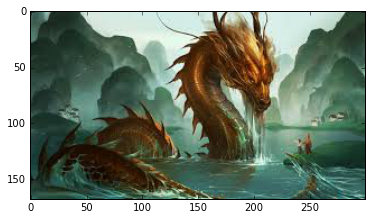

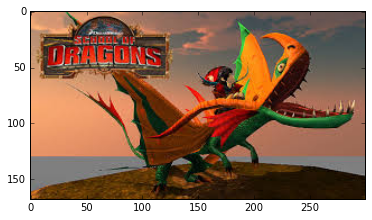

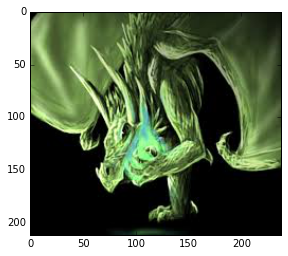

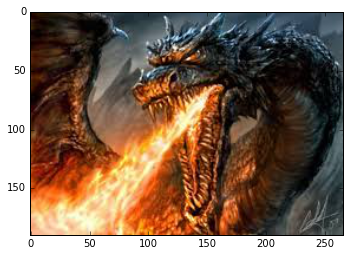

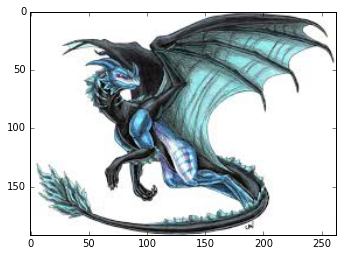

...

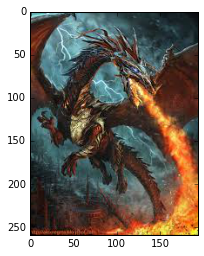

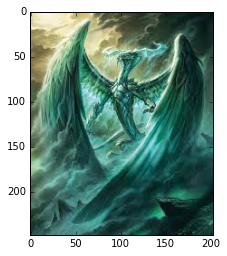

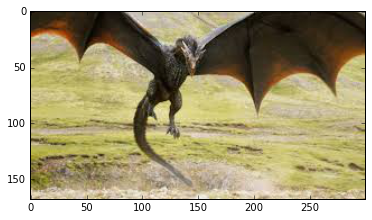

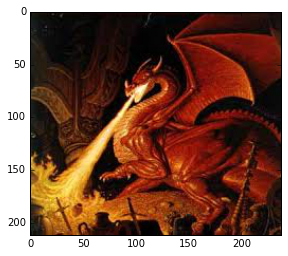

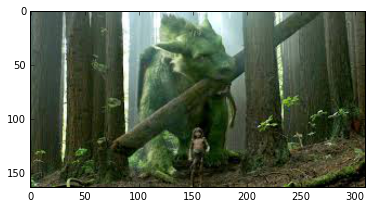

In [86]:
%matplotlib inline


import matplotlib.image as mpimg
import matplotlib.pyplot as plt

def process(filename):
    image = mpimg.imread(filename)
    #<something gets done here>
    plt.figure()
    plt.imshow(image)

for bird in birds.keys():
    process(bird)



In [81]:
birds.keys()


['pic_048.jpg',
 'pic_077.jpg',
 'pic_164.jpg',
 'pic_161.jpg',
 'pic_092.jpg',
 'pic_119.jpg',
 'pic_107.jpg',
 'pic_174.jpg',
 'pic_185.jpg',
 'pic_200.jpg',
 'pic_129.jpg',
 'pic_114.jpg',
 'pic_036.jpg',
 'pic_059.jpg',
 'pic_009.jpg',
 'pic_168.jpg',
 'pic_147.jpg',
 'pic_063.jpg',
 'pic_098.jpg',
 'pic_152.jpg',
 'pic_116.jpg',
 'pic_191.jpg',
 'pic_132.jpg',
 'pic_078.jpg',
 'pic_111.jpg',
 'pic_110.jpg',
 'pic_023.jpg',
 'pic_071.jpg',
 'pic_032.jpg',
 'pic_162.jpg',
 'pic_049.jpg',
 'pic_025.jpg',
 'pic_051.jpg',
 'pic_089.jpg',
 'pic_146.jpg',
 'pic_068.jpg',
 'pic_041.jpg',
 'pic_104.jpg',
 'pic_019.jpg',
 'pic_072.jpg',
 'pic_015.jpg',
 'pic_038.jpg',
 'pic_037.jpg',
 'pic_008.jpg',
 'pic_018.jpg',
 'pic_101.jpg',
 'pic_158.jpg',
 'pic_144.jpg',
 'pic_199.jpg',
 'pic_055.jpg',
 'pic_184.jpg',
 'pic_088.jpg',
 'pic_070.jpg',
 'pic_043.jpg',
 'pic_039.jpg',
 'pic_081.jpg',
 'pic_094.jpg',
 'pic_086.jpg',
 'pic_056.jpg',
 'pic_017.jpg',
 'pic_175.jpg',
 'pic_027.jpg',
 'pic_18